<font color='blue'> **Tacho_watershed** </font> **MG** 

In [1]:
import flopy;import matplotlib.pyplot as plt;import numpy as np;from flopy.discretization import StructuredGrid;import os;from typing import List, Tuple, Union;from pathlib import Path;
import pandas as pd;from flopy.utils.gridintersect import GridIntersect;from shapely.geometry import LineString, Polygon;import warnings;warnings.filterwarnings("ignore", category=DeprecationWarning); 
import earthpy.spatial as es;import geopandas as gpd;import rioxarray as rxr;import rasterio as rio; from rasterio.plot import plotting_extent ;import earthpy.plot as ep ; from pandas import * 

R1 = Path('E:/15_REPOS/02_Beta-Me/data/Tacho_02')       ; R2   =                         (R1/'a00_Tacho_raster.tif')                  
TA = Path("./TA") ;TA.mkdir(exist_ok=True)              ; TOPO = flopy.utils.Raster.load (R1/'a00_Tacho_raster.tif')
#arr = TOPO.get_array(1)    ; idx = np.isfinite(arr)    ;vmin, vmax = arr[idx].min(), arr[idx].max()                  ;CRS=TOPO.crs  ;  print('vmin, vmax=',vmin, vmax,CRS)

(456972.2813, 477397.2813, 7605680.25, 7622267.75) (462809.7813, 472597.2813, 7607105.25, 7618530.25)


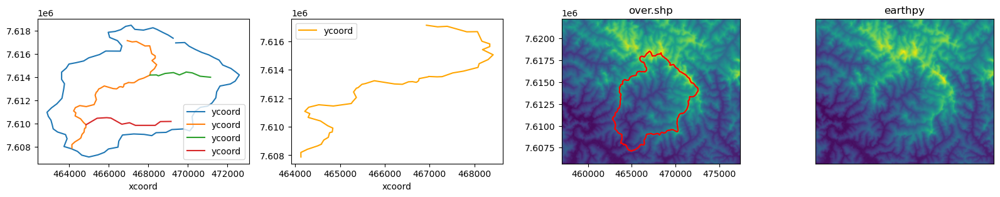

In [2]:
XA=ExcelFile(os.path.join(R1/'poly.xlsx'))    ;DF0=XA.parse(XA.sheet_names[0])  ;DF0.head(2)   ;DF0['ab'] = DF0['xcoord'].astype(str)+' '+DF0['ycoord'].astype(str); 
XA=ExcelFile(os.path.join(R1/'str1.xlsx'))    ;DF1=XA.parse(XA.sheet_names[0])  ;DF1.head(2)   ;DF1['ab'] = DF1['xcoord'].astype(str)+' '+DF1['ycoord'].astype(str); 
XA=ExcelFile(os.path.join(R1/'str2.xlsx'))    ;DF2=XA.parse(XA.sheet_names[0])  ;DF2.head(2)   ;DF2['ab'] = DF2['xcoord'].astype(str)+' '+DF2['ycoord'].astype(str); 
XA=ExcelFile(os.path.join(R1/'str3.xlsx'))    ;DF3=XA.parse(XA.sheet_names[0])  ;DF2.head(2)   ;DF3['ab'] = DF3['xcoord'].astype(str)+' '+DF3['ycoord'].astype(str); 
XA=ExcelFile(os.path.join(R1 ,'s03.xlsx'))    ;DG1=XA.parse(XA.sheet_names[0])  ;DG1['ab']    = DG1['xcoord'].astype(str)+' '+DG1['ycoord'].astype(str)   

VEC = gpd.read_file(os.path.join(R1/'06_bacia_vetor.shp'))        ;OVER=VEC.to_crs(es.crs_check(R2))  ; RA=rxr.open_rasterio(R2,masked=True)  ;BOTH=plotting_extent(RA[0],RA.rio.transform())
S1   = rxr.open_rasterio(R2,masked=True).rio.clip(OVER.geometry)                                      ; NAIP = plotting_extent(S1[0], S1.rio.transform())  ; print(BOTH,NAIP) ; 

fig = plt.figure(figsize=(20,3))                                                         
ax = fig.add_subplot(141)  ; DF0.plot(x='xcoord', y='ycoord', ax=ax)  ;DF1.plot(ax=ax,x='xcoord',y='ycoord')  ;DF2.plot(ax=ax,x='xcoord',y='ycoord')  ;DF3.plot(ax=ax,x='xcoord',y='ycoord')
ax = fig.add_subplot(142)  ; DG1.plot(x='xcoord', y='ycoord', ax=ax, color='orange')           # DG1.head(2)

ax = fig.add_subplot(143)  ; TOPO.plot(ax=ax)        ; OVER.boundary.plot(ax=ax, color='red')   ; plt.title("over.shp")
ax = fig.add_subplot(144)  ; ep.plot_rgb(RA.values,rgb=[0],ax=ax,title="earthpy",extent=BOTH)   ; plt.show(block=False)     ; #; OVER.boundary.plot(ax=ax, color='red') 

(1327, 1634)


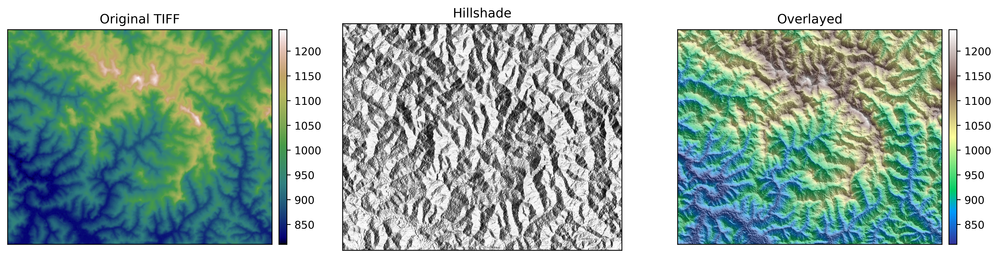

In [3]:
with rio.open(R2) as src: ELEV = src.read(1).astype("float")        ; ELEV[ELEV<0]=np.nan           ;HS=es.hillshade(ELEV)    ;AZ=es.hillshade(ELEV,azimuth=90,altitude=50)

DEM1 = rio.open(os.path.join(R1,'a00_Tacho_raster.tif'))     ; DEM2=DEM1.read(1,masked=True)     ; DEM3 = DEM1.meta.copy()      ;NEW = str(TA)+'/'+str('OEW.tif')
with rio.open(NEW, 'w', **DEM3) as MOW:                        MOW.write(es.hillshade(DEM2), 1)  # _________________________________________________________________ Just saving 

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 12), dpi=500) ; print(ELEV.shape)  
ep.plot_bands(ELEV, cmap= "gist_earth", title="Original TIFF",ax=ax[0]) 
ep.plot_bands(AZ  , cbar= False       , title="Hillshade"    ,ax=ax[1])   # 210 0
ep.plot_bands(ELEV, cmap="terrain"    , title="Overlayed"    ,ax=ax[2]) ; ax[2].imshow(HS, cmap="Greys",alpha=0.5) ;plt.show()

<font color='orange'> **GIS _____________________________________________________________________________________________________________** </font> 

In [4]:
SHP  = gpd.read_file(os.path.join(R1 / '06_bacia_vetor.shp'  ))     ; uTm_p0 = SHP.to_crs(es.crs_check(R1 / "a00_Tacho_raster.tif" )) 
#SHP = gpd.read_file(os.path.join(R1 / 'srt_3p.shp'  ))           ; uTm_s0 = SHP.to_crs(es.crs_check(R1 / "a00_Tacho_raster.tif" )) 
SHP  = gpd.read_file(os.path.join(R1 / 'str_1.shp'  ))            ; uTm_s1 = SHP.to_crs(es.crs_check(R1 / "a00_Tacho_raster.tif" )) 
#SHP = gpd.read_file(os.path.join(R1 / 'str_2.shp'  ))            ; uTm_s2 = SHP.to_crs(es.crs_check(R1 / "a00_Tacho_raster.tif" )) 
#SHP = gpd.read_file(os.path.join(R1 / 'str_3.shp'  ))            ; uTm_s3 = SHP.to_crs(es.crs_check(R1 / "a00_Tacho_raster.tif" )) 

TIF  = rxr.open_rasterio         (R1 / "a00_Tacho_raster.tif", masked=True)                    ; A_ext = plotting_extent(TIF[0], TIF.rio.transform()) #  ; print(cur_crs)
TIF2 = rxr.open_rasterio(R1/"a00_Tacho_raster.tif",masked=True).rio.clip(uTm_p0.geometry)      ; B_ext = plotting_extent(TIF2[0], TIF2.rio.transform())  ; B_ext

(462809.7813, 472597.2813, 7607105.25, 7618530.25)

In [ ]:
# set_structured_idomain    # intersect_segments     build_drain_data   # cell_areas    # build_groundwater_discharge_data

<font color='blue'> **MODFLOW** </font> 

In [ ]:
Lx=Ly= 12000 ; dx=dy=500.0                   ; nrow=int(Ly/dy)+1  ;ncol=int(Lx/dx)+1                             ; un  = "meters"
nlay = 1  ; dv0 = 5.0   ; leakance = 1.0 / (0.5 * dv0)   ; idomain = np.ones((nlay , nrow , ncol ), dtype=int)   ; epsg=32723  
top=np.ones((nlay,nrow,ncol),dtype=float);botm=np.zeros((nlay,nrow,ncol),dtype=float)                            ; xoff=B_ext[0]-1000 ;yoff=B_ext[2]-400
  
sim = flopy.mf6.MFSimulation (sim_ws=TA ,exe_name="mf6" ,memory_print_option="summary" ,)
gwf = flopy.mf6.ModflowGwf   (sim , print_input=True ,save_flows=True ,newtonoptions="NEWTON UNDER_RELAXATION")
flopy.mf6.ModflowGwfdis (gwf ,length_units=un, nlay=nlay ,nrow=nrow ,ncol=ncol ,delr=dx ,delc=dy ,idomain=idomain ,
                         top=top ,botm=botm,xorigin=xoff ,yorigin=yoff)      ; gwf.modelgrid.epsg = epsg   ; print('DIS(gwf.modelgrid): ', gwf.modelgrid )

In [ ]:
irow, icol = gwf.modelgrid.intersect(xoff+3200, yoff+2900)  
def beta_plot(ax):
    pmv=flopy.plot.PlotCrossSection(model=gwf,ax=ax2, line={"column": icol}) ; pmv.plot_grid(linewidth=0.5) ; pmv.plot_inactive()
    pmv=flopy.plot.PlotCrossSection(model=gwf,ax=ax1, line={"row"   : irow}) ; pmv.plot_grid(linewidth=0.5) ; pmv.plot_inactive()
plt.figure(figsize=(12,4))
ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=1, rowspan=1)  ; ax2 = plt.subplot2grid((3, 3), (0, 1), colspan=2, rowspan=1)  ; beta_plot(ax1) ; beta_plot(ax2) 

In [ ]:
boundary_polygon = uTm_p0['geometry'].iloc[0]             
stream_segs = uTm_s1['geometry'].iloc[0]                  ; uTm_s1.head(5)    ; uTm_s1.to_csv (TA / "01_merged_str.csv") 
#uTm_p0.to_csv (TA / "02_poly.csv") 

In [ ]:
def set_structured_idomain( modelgrid: flopy.discretization.StructuredGrid,   boundary: List[tuple] ) -> None:

    ix = GridIntersect(modelgrid, method="vertex", rtree=True)     ; result = ix.intersect(Polygon(boundary))
    idx = [coords for coords in result.cellids]                    ; idx = np.array(idx, dtype=int)               ; nr = idx.shape[0]
    if idx.ndim == 1:
        idx = idx.reshape((nr, 1))
    idx = tuple([idx[:, i] for i in range(idx.shape[1])])          ; idomain = np.zeros(modelgrid.shape[1:], dtype=int)
    idomain[idx] = 1 ; idomain = idomain.reshape(modelgrid.shape)  ;     modelgrid.idomain = idomain
    return
working_grid     = StructuredGrid(nlay=nlay,delr=np.full(ncol, dx) , delc=np.full(nrow, dy),
                                  xoff=xoff,yoff=yoff,top=np.full((nrow, ncol), 1000.0),botm=np.full((1, nrow, ncol), -100.0), crs = epsg)
set_structured_idomain(working_grid, boundary_polygon)

In [ ]:
sgs = stream_segs
top_wg  = TOPO.resample_to_grid(working_grid,band=TOPO.bands[0],method="linear",extrapolate_edges=True)
def intersect_segments(modelgrid: Union[flopy.discretization.StructuredGrid, flopy.discretization.VertexGrid],segments: List[List[tuple]]) -> Tuple[flopy.utils.GridIntersect, list, list]:
    ixs = flopy.utils.GridIntersect(modelgrid,method=modelgrid.grid_type)  ; cellids = []  ; lengths = []
    vv = ixs.intersect(LineString(segments)) ; cellids += vv["cellids"].tolist()  ; lengths += vv["lengths"].tolist()
    return ixs, cellids, lengths

ixs, cellids, lengths = intersect_segments(working_grid, sgs)  

In [ ]:
def build_drain_data(modelgrid: Union[flopy.discretization.StructuredGrid, flopy.discretization.VertexGrid],cellids: list,lengths: list,leakance: float,elevation: np.ndarray,) -> List[tuple]:
    drn_data = []
    for cellid, length in zip(cellids, lengths):
        x = modelgrid.xcellcenters[cellid]    ; width = 5.0 + (14.0 / Lx) * (Lx - x)  ; conductance = leakance * length * width
        if not isinstance(cellid, tuple):
            cellid = (cellid,)
        drn_data.append((0, *cellid, elevation[cellid], conductance))
    return drn_data
nlay = 5 ; dv0 = 5.0
leakance = 1.0 / (0.5 * dv0)  ; drn_data = build_drain_data(working_grid,cellids,lengths,leakance,top_wg)  #; drn_data[:10]

In [ ]:
def cell_areas(modelgrid: Union[flopy.discretization.StructuredGrid, flopy.discretization.VertexGrid]) -> np.ndarray:
    if modelgrid.grid_type == "structured":
        nrow, ncol = modelgrid.nrow, modelgrid.ncol ; areas = np.zeros((nrow, ncol), dtype=float)
        for r in range(nrow):
            for c in range(ncol): 
                cellid = (r, c) ; vertices = np.array(modelgrid.get_cell_vertices(cellid)) ; area = Polygon(vertices).area ; areas[cellid] = area
    elif modelgrid.grid_type == "vertex": 
        areas = np.zeros(modelgrid.ncpl, dtype=float)
        for idx in range(modelgrid.ncpl): 
            vertices = np.array(modelgrid.get_cell_vertices(idx))  ; area = Polygon(vertices).area ; areas[idx] = area
    else:   raise ValueError(+ f"{modelgrid.grid_type}")
    return areas

In [ ]:
def build_groundwater_discharge_data(modelgrid: Union[flopy.discretization.StructuredGrid, flopy.discretization.VertexGrid],
                                     leakance: float,elevation: np.ndarray,) -> List[tuple]:
    areas = cell_areas(modelgrid)   ; drn_data = [] ; idomain = modelgrid.idomain[0]
    for idx in range(modelgrid.ncpl):
        if modelgrid.grid_type == "structured":  r, c = modelgrid.get_lrc(idx)[0][1:]  ; cellid = (r, c)
        else:                                    cellid = idx 
        area = areas[cellid]
        if idomain[cellid] == 1:
            conductance = leakance * area
            if not isinstance(cellid, tuple):    cellid = (cellid,)
            drn_data.append((0, *cellid, elevation[cellid] - 0.5, conductance, 1.0))
    return drn_data

gw_discharge_data = build_groundwater_discharge_data(working_grid,leakance, top_wg)  # gw_discharge_data[:10]

In [ ]:
idomain = np.array([working_grid.idomain[0, :, :].copy() for k in range(nlay)]) ; strt    = np.array([top_wg.copy() for k in range(nlay)], dtype=float)
topc = np.zeros((nlay, nrow, ncol), dtype=float)                                ; botm = np.zeros((nlay, nrow, ncol), dtype=float)
dv = dv0 ; topc[0] = top_wg.copy()                                              ; botm[0] = topc[0] - dv
for idx in range(1, nlay):  dv *= 1.5                                           ; topc[idx] = botm[idx - 1]    ; botm[idx] = topc[idx] - dv
for k in range(nlay): print((topc[k] - botm[k]).mean())

In [ ]:
#sim = flopy.mf6.MFSimulation(sim_ws=TA,exe_name="mf6",memory_print_option="summary",)
flopy.mf6.ModflowTdis(sim)
flopy.mf6.ModflowIms(sim,complexity="simple",print_option="SUMMARY",csv_outer_output_filerecord="outer.csv",
                     csv_inner_output_filerecord="inner.csv",linear_acceleration="bicgstab",outer_maximum=1000,inner_maximum=100,
                     outer_dvclose=1e-4,inner_dvclose=1e-5,preconditioner_levels=2,relaxation_factor=0.0)
#gwf = flopy.mf6.ModflowGwf(sim,print_input=True,save_flows=True,newtonoptions="NEWTON UNDER_RELAXATION")
flopy.mf6.ModflowGwfdis  (gwf,nlay=nlay,nrow=nrow,ncol=ncol,delr=dx,delc=dy,idomain=idomain,top=top_wg,botm=botm,xorigin=0.0,yorigin=0.0)
flopy.mf6.ModflowGwfic   (gwf, strt=strt)
flopy.mf6.ModflowGwfnpf  (gwf,save_specific_discharge=True,icelltype=1,k=1.0)
flopy.mf6.ModflowGwfrcha (gwf,recharge=0.000001)
flopy.mf6.ModflowGwfdrn  (gwf,maxbound=len(drn_data),stress_period_data=drn_data,pname="river" ,filename="drn_riv.drn")
flopy.mf6.ModflowGwfdrn  (gwf,auxiliary=["depth"] ,auxdepthname="depth",
                          maxbound=len(gw_discharge_data), stress_period_data=gw_discharge_data,pname="gwd",filename="drn_gwd.drn")
flopy.mf6.ModflowGwfoc   (gwf,head_filerecord=f"{gwf.name}.hds",budget_filerecord=f"{gwf.name}.cbc",
                          saverecord=[("HEAD", "ALL"), ("BUDGET", "ALL")],printrecord=[("BUDGET", "ALL")]) ; 

In [ ]:
icol = icol + 6;  irow = irow -7
print(nrow, ncol, '__', icol, irow )
def beta_plot(ax):
    pmv=flopy.plot.PlotCrossSection(model=gwf,ax=ax1, line={"row"   : irow}) ; pmv.plot_grid(linewidth=0.5) ; pmv.plot_inactive()
    pmv=flopy.plot.PlotCrossSection(model=gwf,ax=ax2, line={"column": icol}) ; pmv.plot_grid(linewidth=0.5) ; pmv.plot_inactive()
plt.figure(figsize=(12,4))
ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=1, rowspan=1)  ; ax2 = plt.subplot2grid((3, 3), (0, 1), colspan=2, rowspan=1)  ; beta_plot(ax1) ; beta_plot(ax2) 

In [ ]:
sim.write_simulation()

In [ ]:
fig = plt.figure(figsize=(13, 4))                             
ax = fig.add_subplot(111, aspect="equal")     ; pmv = flopy.plot.PlotMapView(gwf, ax=ax)  ; lc = pmv.plot_grid(lw=0.1)  
pmv.plot_bc("DRN", plotAll=True, color='red') ; plt.show()